In [99]:
import sys
sys.path.append('../')

import osmnx as ox
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle as pkl
import geopandas as gpd

from src.utils import load_file
from src import get_graph as gg
from src import graphlet_degree as gd
from src.orcalib import orca

from mpl_toolkits.axes_grid1 import make_axes_locatable

# Graphlet Degree Distribution Analysis

## 1. Obtaining the Street Networks and the node Graphlet Degree Vectors

In [45]:
graph_NY = gg.simplify_graph(ox.graph_from_place('New York City, United States', network_type='drive'))
graph_RJ = gg.simplify_graph(ox.graph_from_place('Rio de Janeiro, Brazil', network_type='drive'))
graph_Paris = gg.simplify_graph(ox.graph_from_place('Paris, France', network_type='drive'))

/Users/gsagostini/Desktop/urban-graphlets/notebooks/../src/get_graph.py:57: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  H1 = ox.consolidate_intersections(H, tolerance=tol, dead_ends=True)
/Users/gsagostini/Desktop/urban-graphlets/notebooks/../src/get_graph.py:57: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  H1 = ox.consolidate_intersections(H, tolerance=tol, dead_ends=True)
/Users/gsagostini/Desktop/urban-graphlets/notebooks/../src/get_graph.py:57: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  H1 = ox.consolidate_intersections(H, tolerance=tol, dead_ends=True)


In [46]:
graph_NY_withGDV, node_gdf_NY = gd.add_GDV(graph_NY)
graph_RJ_withGDV, node_gdf_RJ = gd.add_GDV(graph_RJ)
graph_Paris_withGDV, node_gdf_Paris = gd.add_GDV(graph_Paris)

## 2. Comparing the Distributions

In [122]:
cities = ['New York', 'Rio de Janeiro', 'Paris']
node_gdfs = [node_gdf_NY, node_gdf_RJ, node_gdf_Paris]
full_node_gdf = gd.join_gdfs(node_gdfs, cities, prepared=True)

First let's plot histograms for all the orbits. This will not be easy to compare, but it will let us visualize orbits for which there is significant patterns we want to explore further.

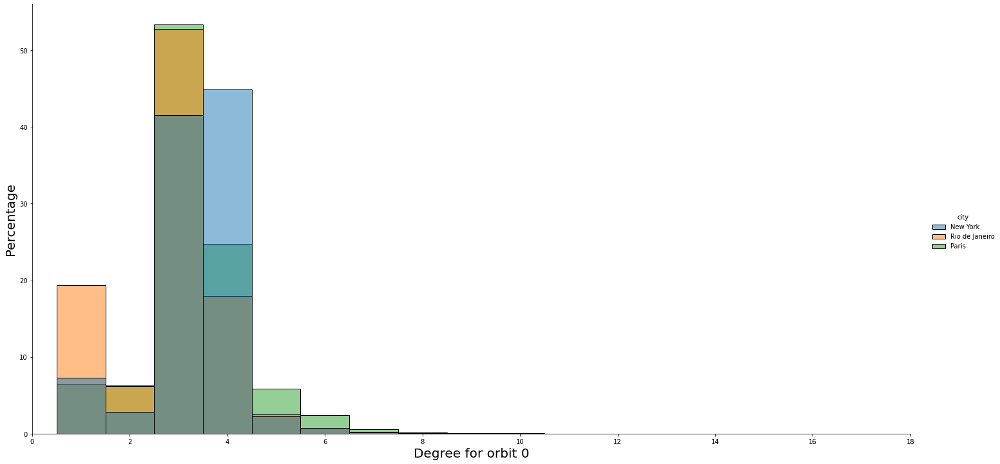

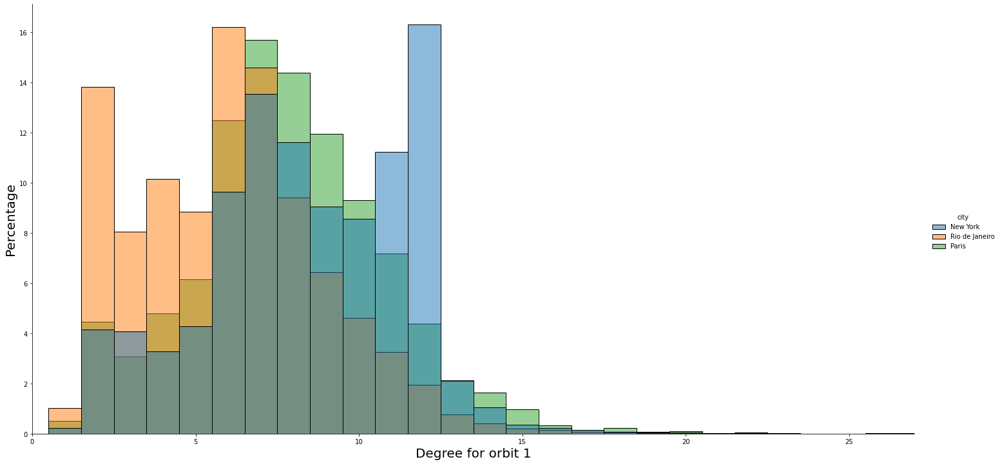

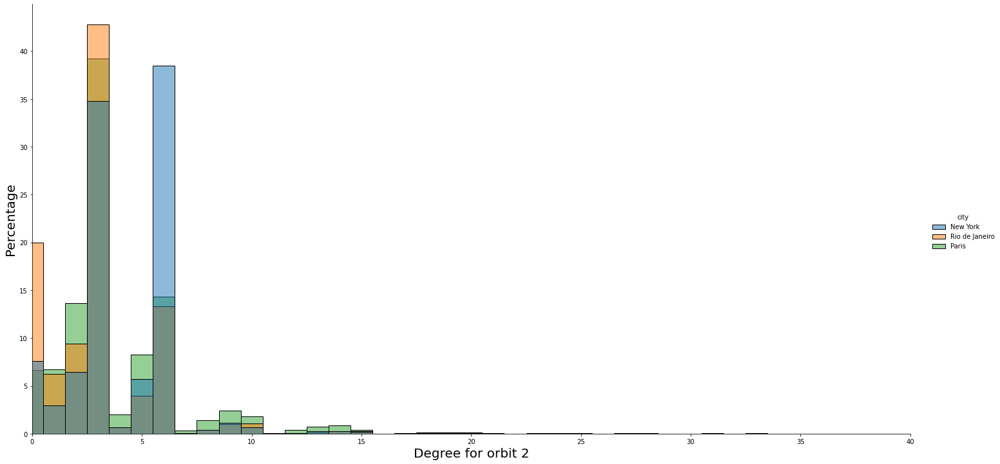

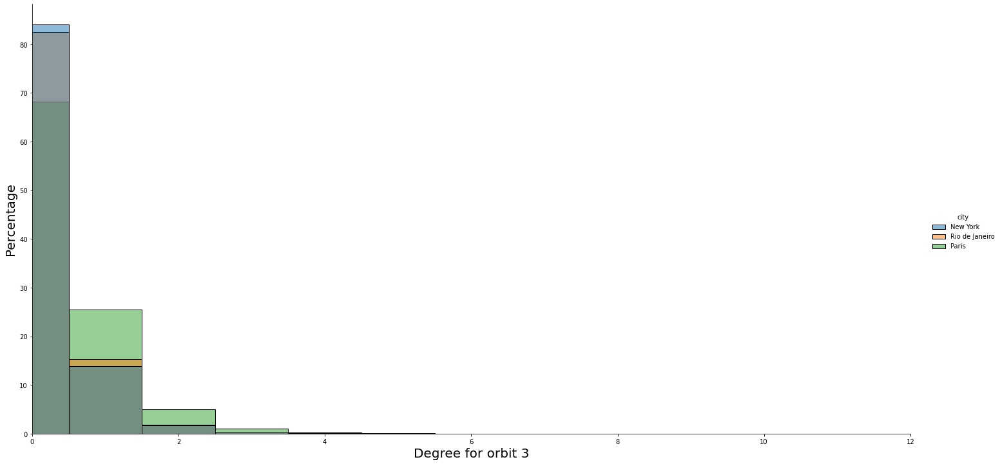

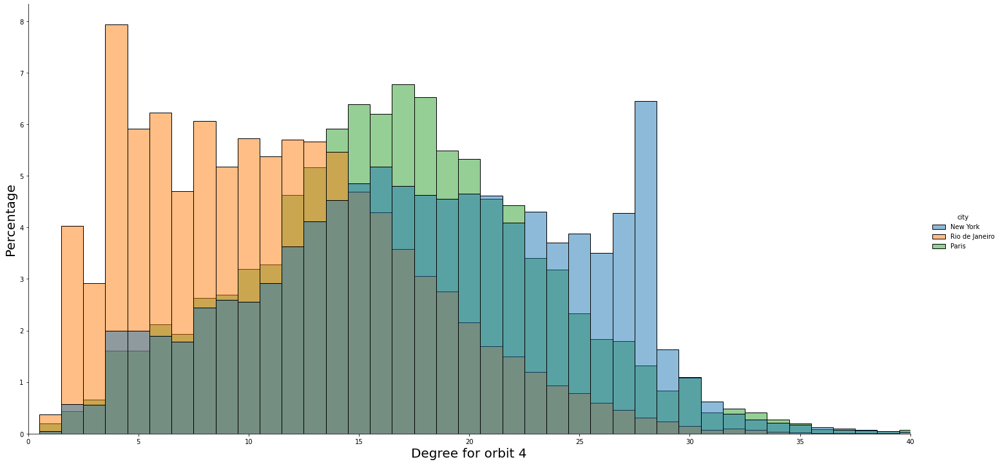

...

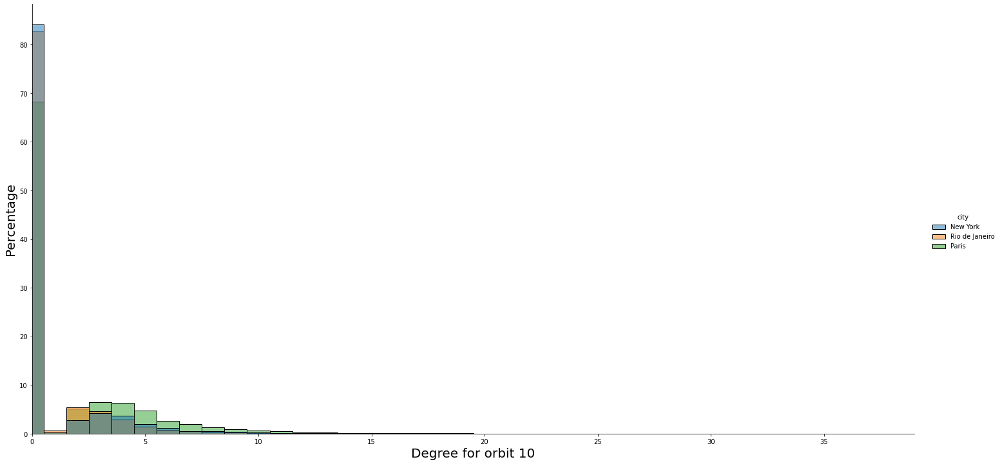

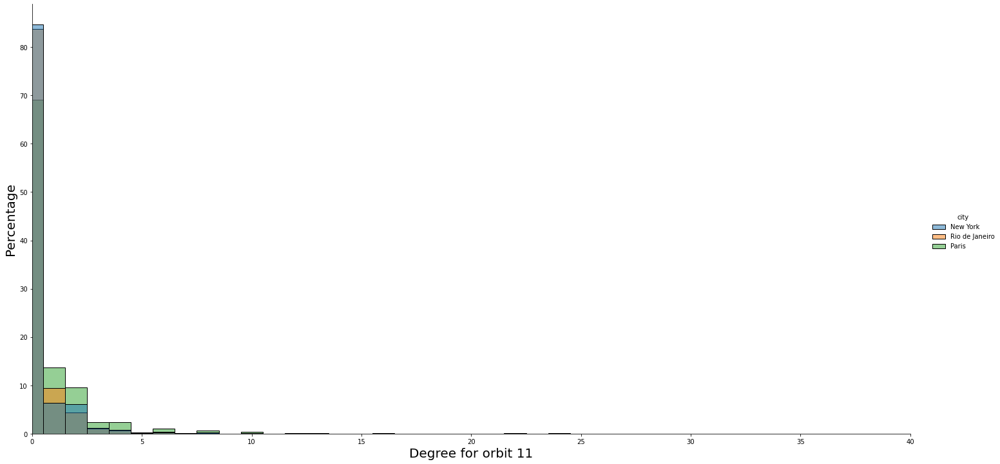

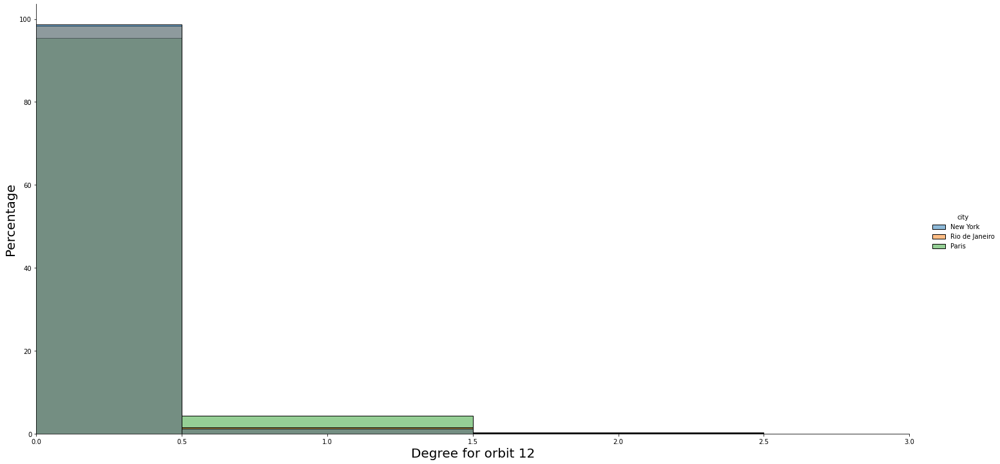

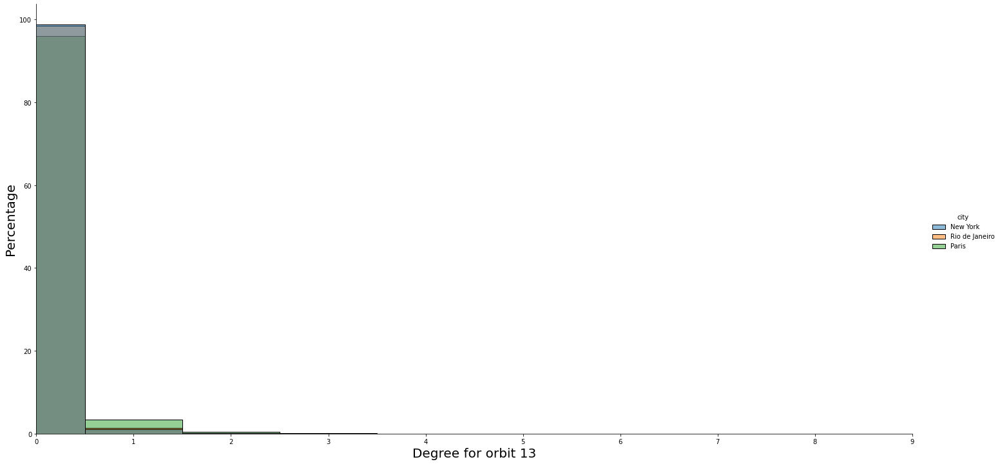

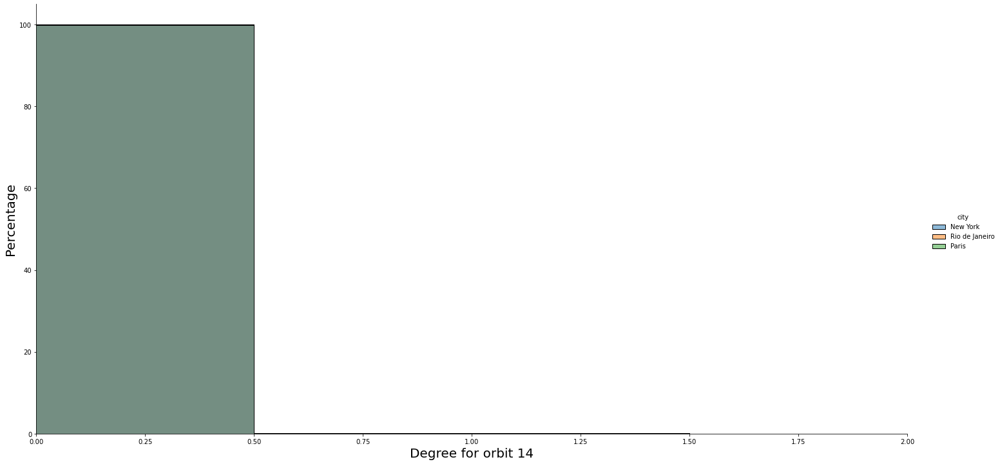

In [48]:
for orbit_no in range(15):
    fc = gd.plot_hist(full_node_gdf, orbit_no, together=True)
    plt.show()

From these histograms, it seems like any orbit above orbit 8, the square, has an almost trivial distribution. We will focus on the following groups of orbits:

- Orbit 0, the trivial degree
- Orbits 1 and 2, the endpoints and midpoints of a 3-path
- Orbits 4 and 5, the endpoitns and midpoints of a 4-path
- Orbits 6 and 7, the endpoints and midpoint of a 4-star
- Orbit 8, the square


### 2.1. Orbit 0 --- the degree

Below we plot the three histograms for orbit 0:

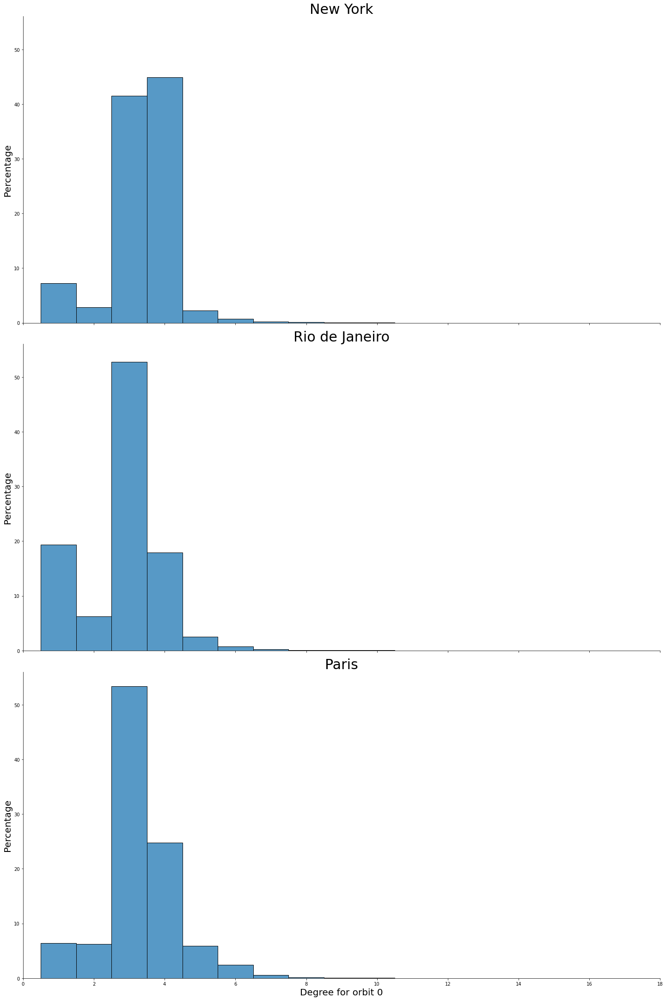

In [49]:
f = gd.plot_hist(full_node_gdf, 0, together=False)

<AxesSubplot:xlabel='city', ylabel='0'>

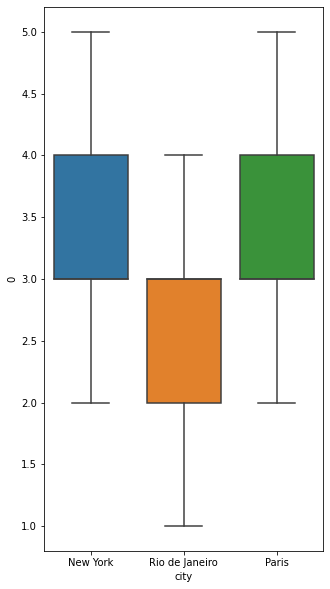

In [125]:
gd.plot_boxplot(full_node_gdf, 0)

In [104]:
trivial_degrees = [k for k in range(19)]

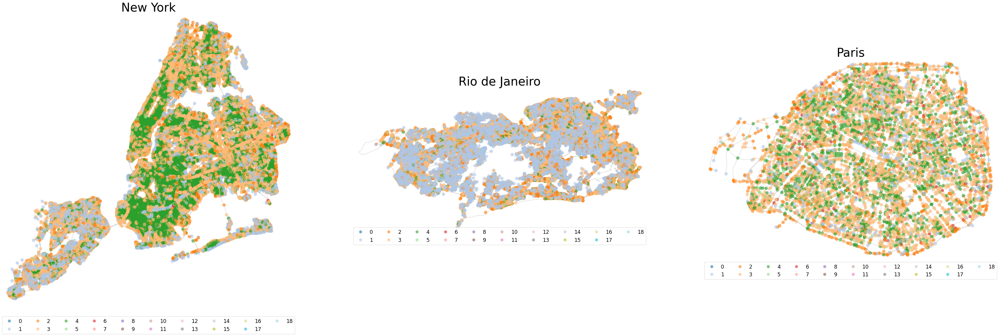

In [117]:
fig, Axes = plt.subplots(figsize=(60, 20), ncols=3)
for gdf, graph, city, ax in zip([node_gdf_NY, node_gdf_RJ, node_gdf_Paris],
                                [graph_NY_withGDV, graph_RJ_withGDV, graph_Paris_withGDV],
                                cities, Axes.flatten()):
    ax = ox.plot_graph(graph, node_size=0, edge_linewidth=0.5, ax=ax, show=False)[1]
    ax = gdf.plot(column=0, ax=ax, categorical=True, markersize=100, categories=trivial_degrees, cmap='tab20', alpha=0.6,
                  legend=True, legend_kwds={'loc':3, 'bbox_to_anchor':(0., -.102, 1., .102), 'ncol':10, 'mode':"expand", 'borderaxespad':0, 'fontsize':'xx-large'})
    ax.set_title(city, fontsize=40)

This is hard to compare because the cities have different dimensions. I take a box of 2km square around a point of each graph:

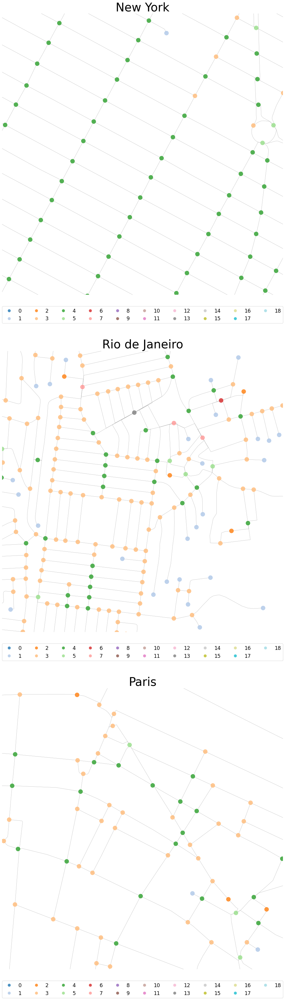

In [114]:
fig, Axes = plt.subplots(figsize=(20, 60), nrows=3)
d=1000
for gdf, graph, aspect, city, ax in zip([node_gdf_NY, node_gdf_RJ, node_gdf_Paris],
                                        [graph_NY_withGDV, graph_RJ_withGDV, graph_Paris_withGDV],
                                        [(0.48, 0.65), (0.26, 0.53), (0.5, 0.5)],
                                        cities, Axes.flatten()):    
    
    
    bd = gdf.total_bounds
    delta_y, delta_x = bd[3]-bd[1], bd[2]-bd[0]
    bbox = (bd[1]+aspect[1]*delta_y+d/2, bd[1]+aspect[1]*delta_y-d/2,
            bd[0]+aspect[0]*delta_x+d/2, bd[0]+aspect[0]*delta_x-d/2)
    #print(bbox)
    ax = ox.plot_graph(graph, node_size=0, edge_linewidth=0.5, ax=ax, show=False, bbox=bbox)[1]
    ax = gdf.plot(column=0, ax=ax, categorical=True, markersize=200, categories=trivial_degrees, cmap='tab20', alpha=0.8,
                  legend=True, legend_kwds={'loc':3, 'bbox_to_anchor':(0., -.102, 1., .102), 'ncol':10, 'mode':"expand", 'borderaxespad':0, 'fontsize':'xx-large'})
    ax.set_title(city, fontsize=40)

Back to New York:

Text(0.5, 1.0, 'New York Trivial Degree')

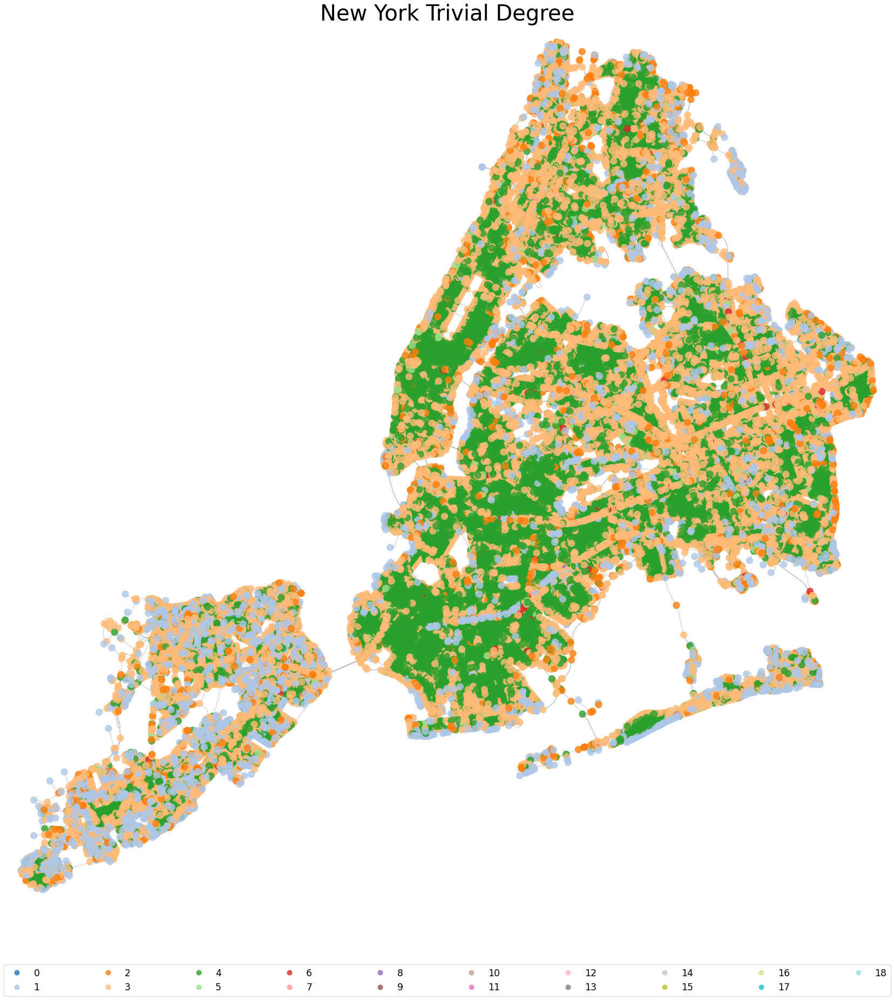

In [119]:
fig, ax = plt.subplots(figsize=(30, 30))
ax = ox.plot_graph(graph_NY_withGDV, node_size=0, edge_linewidth=0.5, ax=ax, show=False)[1]
ax = node_gdf_NY.plot(column=0, ax=ax, categorical=True, markersize=150, categories=trivial_degrees, cmap='tab20', alpha=0.8,
                      legend=True, legend_kwds={'loc':3, 'bbox_to_anchor':(0., -.102, 1., .102), 'ncol':10, 'mode':"expand", 'borderaxespad':0, 'fontsize':'xx-large'})
ax.set_title('New York Trivial Degree', fontsize=40)

### 2.2. Squares

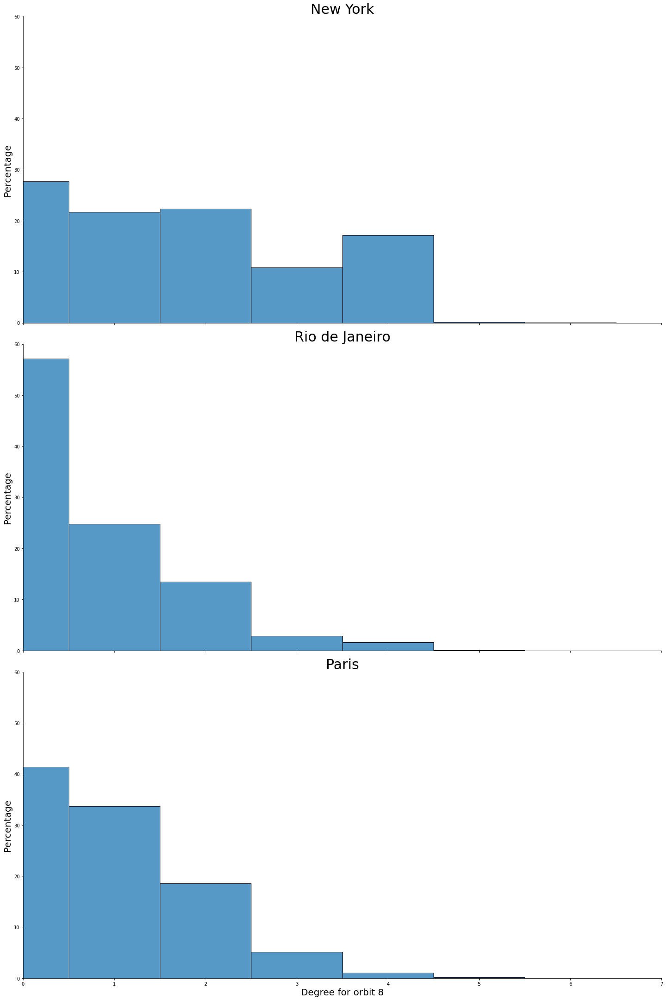

In [90]:
f = gd.plot_hist(full_node_gdf, 8, together=False)

<AxesSubplot:xlabel='city', ylabel='8'>

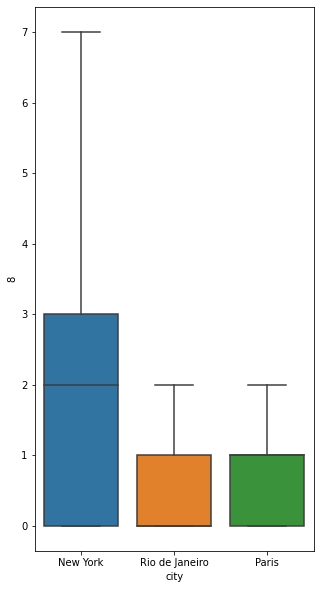

In [121]:
gd.plot_boxplot(full_node_gdf, 8)

In [86]:
square_degrees = [0, 1, 2, 3, 4, 5, 6, 7]

Text(0.5, 1.0, 'New York Squares')

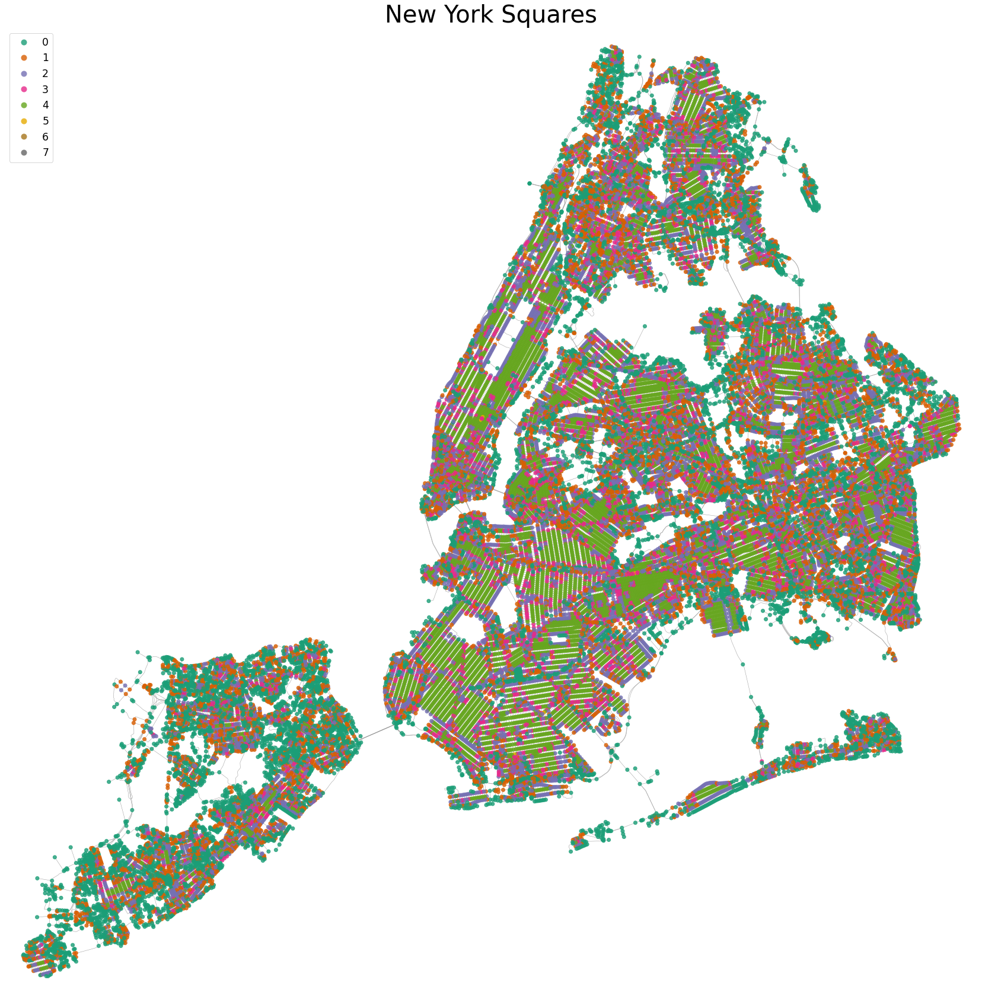

In [126]:
fig, ax = plt.subplots(figsize=(30, 30))
ax = ox.plot_graph(graph_NY_withGDV, node_size=0, edge_linewidth=0.5, ax=ax, show=False)[1]
ax = node_gdf_NY.plot(column=8, ax=ax, categorical=True, categories=square_degrees, cmap='Dark2', alpha=0.8, legend=True, legend_kwds={'loc':'upper left', 'fontsize':'xx-large'})
ax.set_title('New York Squares', fontsize=40)

Text(0.5, 1.0, 'Paris Squares')

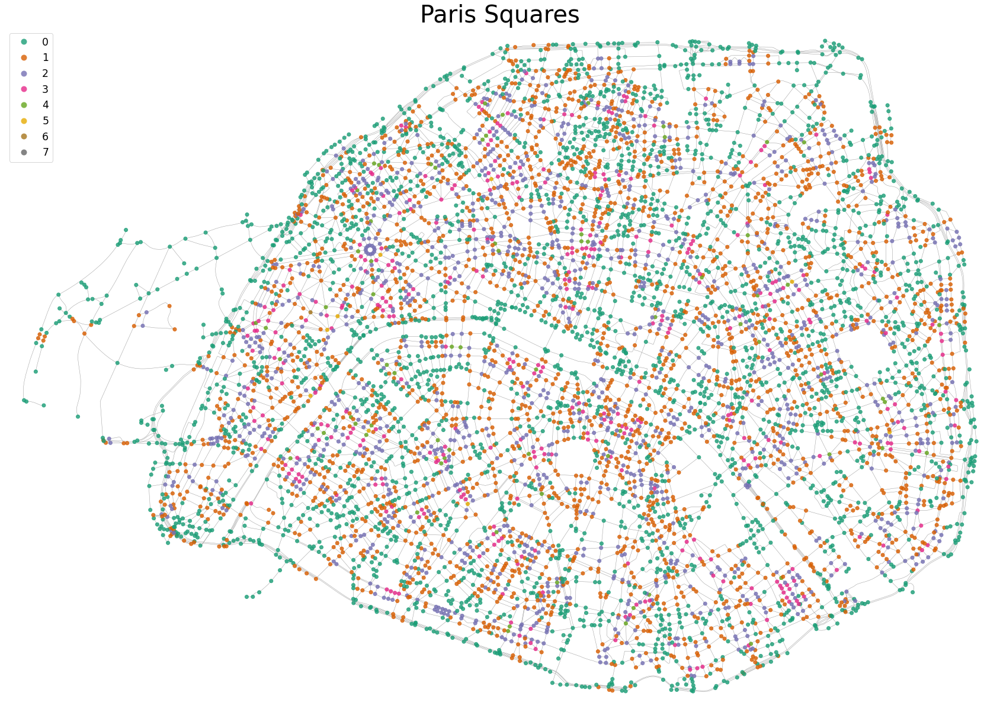

In [127]:
fig, ax = plt.subplots(figsize=(30, 30))
ax = ox.plot_graph(graph_Paris_withGDV, node_size=0, edge_linewidth=0.5, ax=ax, show=False)[1]
ax = node_gdf_Paris.plot(column=8, ax=ax, categorical=True, categories=square_degrees, cmap='Dark2', alpha=0.8, legend=True, legend_kwds={'loc':'upper left', 'fontsize':'xx-large'})
ax.set_title('Paris Squares', fontsize=40)

Text(0.5, 1.0, 'Rio de Janeiro Squares')

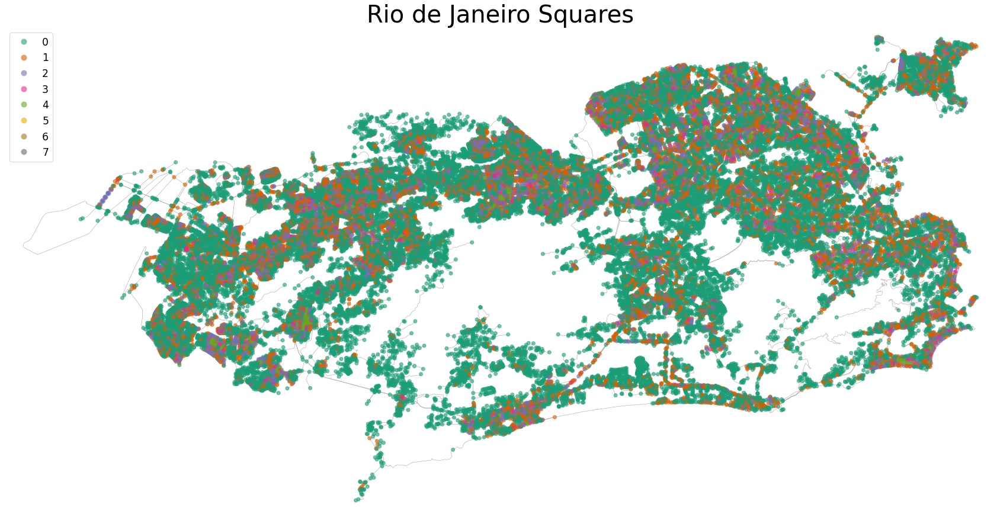

In [130]:
fig, ax = plt.subplots(figsize=(30, 30))
ax = ox.plot_graph(graph_RJ_withGDV, node_size=0, edge_linewidth=0.5, ax=ax, show=False)[1]
ax = node_gdf_RJ.plot(column=8, ax=ax, categorical=True, categories=square_degrees, cmap='Dark2', alpha=0.6, legend=True, legend_kwds={'loc':'upper left', 'fontsize':'xx-large'})
ax.set_title('Rio de Janeiro Squares', fontsize=40)

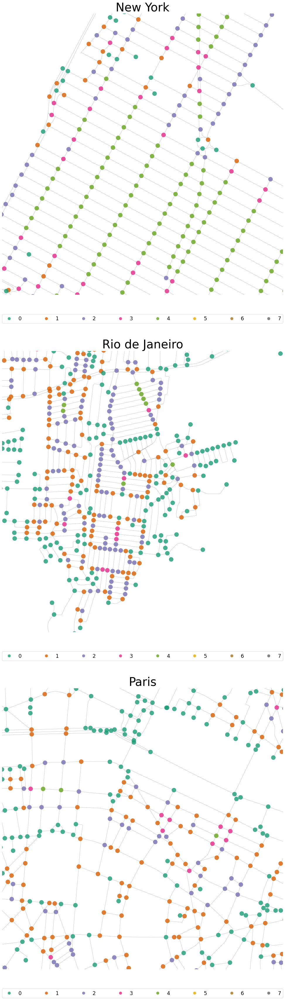

In [133]:
fig, Axes = plt.subplots(figsize=(40, 60), nrows=3)
d=2000
for gdf, graph, aspect, city, ax in zip([node_gdf_NY, node_gdf_RJ, node_gdf_Paris],
                                        [graph_NY_withGDV, graph_RJ_withGDV, graph_Paris_withGDV],
                                        [(0.48, 0.65), (0.26, 0.53), (0.5, 0.5)],
                                        cities, Axes.flatten()):    
    
    
    bd = gdf.total_bounds
    delta_y, delta_x = bd[3]-bd[1], bd[2]-bd[0]
    bbox = (bd[1]+aspect[1]*delta_y+d/2, bd[1]+aspect[1]*delta_y-d/2,
            bd[0]+aspect[0]*delta_x+d/2, bd[0]+aspect[0]*delta_x-d/2)
    ax = ox.plot_graph(graph, node_size=0, edge_linewidth=0.5, ax=ax, show=False, bbox=bbox)[1]
    ax = gdf.plot(column=8, ax=ax, categorical=True, markersize=200, categories=square_degrees, cmap='Dark2', alpha=0.8,
                  legend=True, legend_kwds={'loc':3, 'bbox_to_anchor':(0., -.102, 1., .102), 'ncol':10, 'mode':"expand", 'borderaxespad':0, 'fontsize':'xx-large'})
    ax.set_title(city, fontsize=40)